# Part 1: Compare the ffts of 3 letters

10


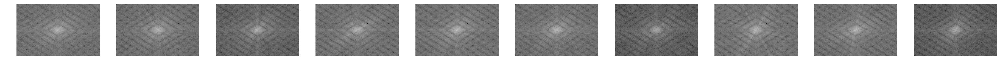

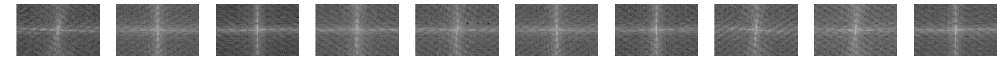

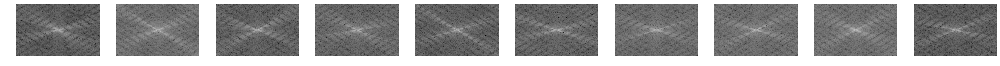

In [102]:
import numpy as np
from skimage import io
from sklearn.neighbors import NearestNeighbors
from sklearn import neighbors
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
# %matplotlib inline
import matplotlib.pylab as pylab
pylab.rcParams['figure.figsize'] = (64.0, 48.0)
pylab.rcParams['font.size'] = 24


#returns the centred fourier transform of an image
def getFFT(filename):
    f = io.imread(filename)   # read in image
    f_f = np.array(f, dtype=float)
    z = np.fft.fft2(f_f)           # do fourier transform
    q = np.fft.fftshift(z)         # puts u=0,v=0 in the centre
    Magq =  np.absolute(q)         # magnitude spectrum
    Phaseq = np.angle(q)           # phase spectrum
    return (q,Magq,Phaseq)
    
sFFT = getFFT('Characters/S1.gif')
tFFT = getFFT('Characters/T1.gif')
vFFT = getFFT('Characters/V1.gif')


#Plots all ten gifs of a specific letters magnitude.
def plotLetter(magArr):
  lFig = plt.figure()
  plotID = 1
  for i in range(10):
    ax = lFig.add_subplot( 1, 10, plotID )
    ax.axis('off')
    ax.imshow( magArr[i], cmap='gray' ) # io.
    plotID += 1
  plt.show()


#Gets the 10 magnitude values for the ten gifs of a specific letter.
def getMagArr(letter):
    arr = []
    for i in range(1,11):
        arr.append(np.log(getFFT("Characters/"+letter+str(i)+".gif")[1] + 1))
    return arr


#Get the magnitudes for a letter
sMagArr = getMagArr("S")
tMagArr = getMagArr("T")
vMagArr = getMagArr("V")

print(len(sMagArr))

#Plot these magnitudes
plotLetter(sMagArr)
plotLetter(tMagArr)
plotLetter(vMagArr)



## Part 1.1 Filtering Data
The Magnitude of each FFT shows the clearest differences between the letters so we will be using them to find features of the data and to build a classifier.

/Users/Callum/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:65: ComplexWarning: Casting complex values to real discards the imaginary part


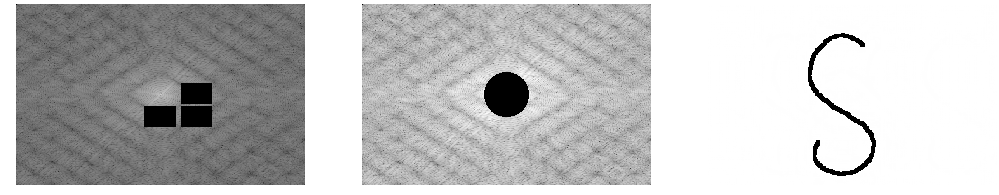

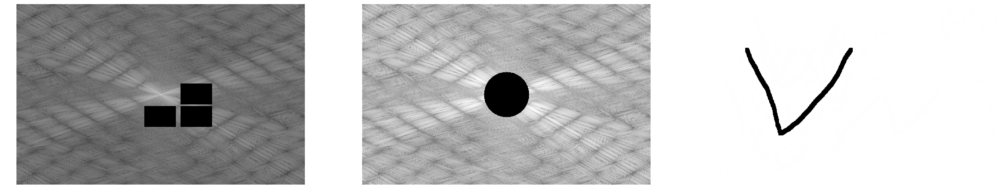

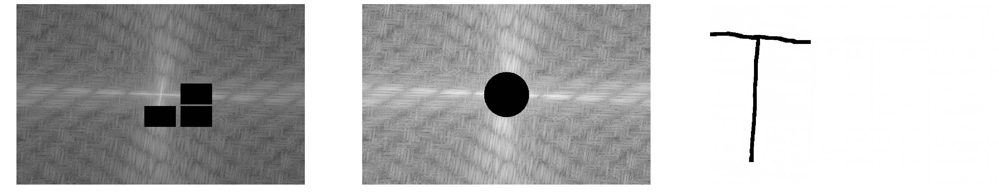

In [28]:
#Create subplots for comparisons
magFig1 = plt.figure()
magAx1a = magFig1.add_subplot(1,3,1)
magAx1b = magFig1.add_subplot(1,3,2)
magAx1c = magFig1.add_subplot(1,3,3)

magFig2 = plt.figure()
magAx2a = magFig2.add_subplot(1,3,1)
magAx2b = magFig2.add_subplot(1,3,2)
magAx2c = magFig2.add_subplot(1,3,3)

magFig3 = plt.figure()
magAx3a = magFig3.add_subplot(1,3,1)
magAx3b = magFig3.add_subplot(1,3,2)
magAx3c = magFig3.add_subplot(1,3,3)


#Sets all magnitude data in the centre of the image to 0, essentially filtering it out.
def highPassFilter(magData):
    for i in range(-60,60):
        for j in range(-60,60):
            if((i ** 2) + (j ** 2) <= (50 ** 2)):
                magData[i+200][j+320] = 0
    return magData


#Checks the magnitude difference between two points.
def checkMags(mag1,mag2):
    dif = 0
    for i in range(0,400):
        for j in range(0,30):   
            dif += np.absolute(mag1[i][j]-mag2[i][j])
    return dif


#Visualises where the block feature extraction will be placed.
def checkBoxPlot(magData):
    for i in range(-23,23):
        for j in range(-35,35):
            magData[249+i][319+j] = 0
            
    for i in range(-23,23):
        for j in range(-35,35):
            magData[249+i][399+j] = 0
            
    for i in range(-23,23):
        for j in range(-35,35):
            magData[199+i][399+j] = 0
    return magData
            

#Updates the figure so that it contains 3 subplots:
#1) Magnitude of the image
#2) Frequency of the image
#3) Original letter it corresponds to.
def compareMagAndImg(fftData,axA,axB,axC):
    #print(checkMags(np.log(fftData[1] + 1),highPassFilter(np.log(fftData[1]+ 1))))
    axA.axis('off')
    axA.imshow( checkBoxPlot(np.log(fftData[1] + 1)), cmap='gray' ) # io.

    axB.axis('off')
    axB.imshow( highPassFilter(np.log(fftData[1]+ 1)), cmap='gray' ) # io.
    
    w = np.fft.ifft2( np.fft.ifftshift(fftData[0]) )
    axC.axis('off')
    axC.imshow( np.array(w,dtype=int), cmap='gray' ) # io.
    return

#Call the function to populate the plots created with the correct data.
compareMagAndImg(sFFT,magAx1a,magAx1b,magAx1c)
compareMagAndImg(vFFT,magAx2a,magAx2b,magAx2c)
compareMagAndImg(tFFT,magAx3a,magAx3b,magAx3c)

plt.show()

### Part 1 Analysis
The Magnitude of each FFT shows the clearest differences between the letters so we will be using them to find features of the data and to build a classifier. Filtering the data by ignoring the central data where high frequencies are located did not help in classifiying the data. So we move on and use spectral feature extraction.

# Part 2: Feature Extraction

Size of image is 400x640 and can be divided into four quarters of 100x160
Centre is 200,320
Good features to use would be the power in 3 5x8 boxes,
one around coordinate 250,320
one around coordinate 250,400
one around coordinate 200,400

## Part 2.1: Spectral Box Feature Extraction Attempt 1

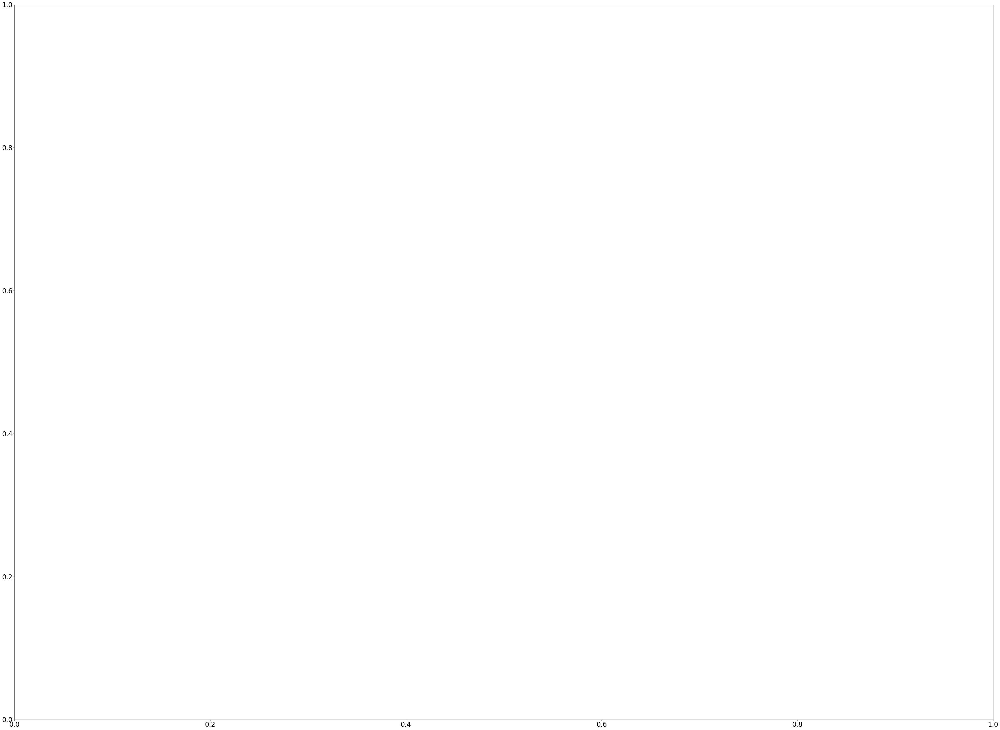

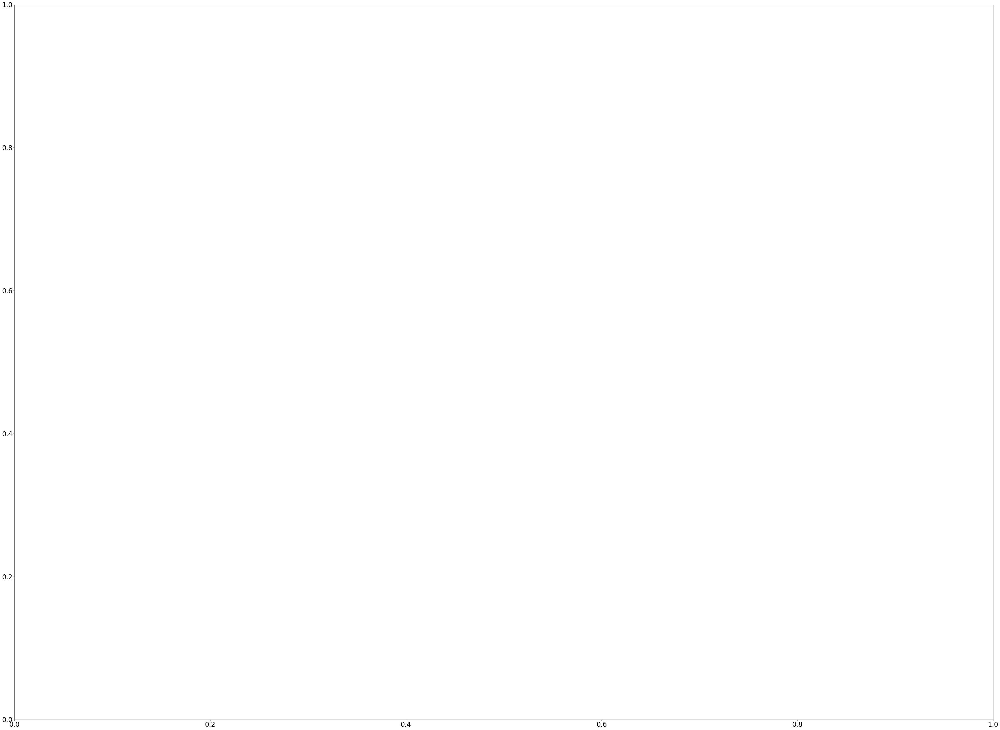

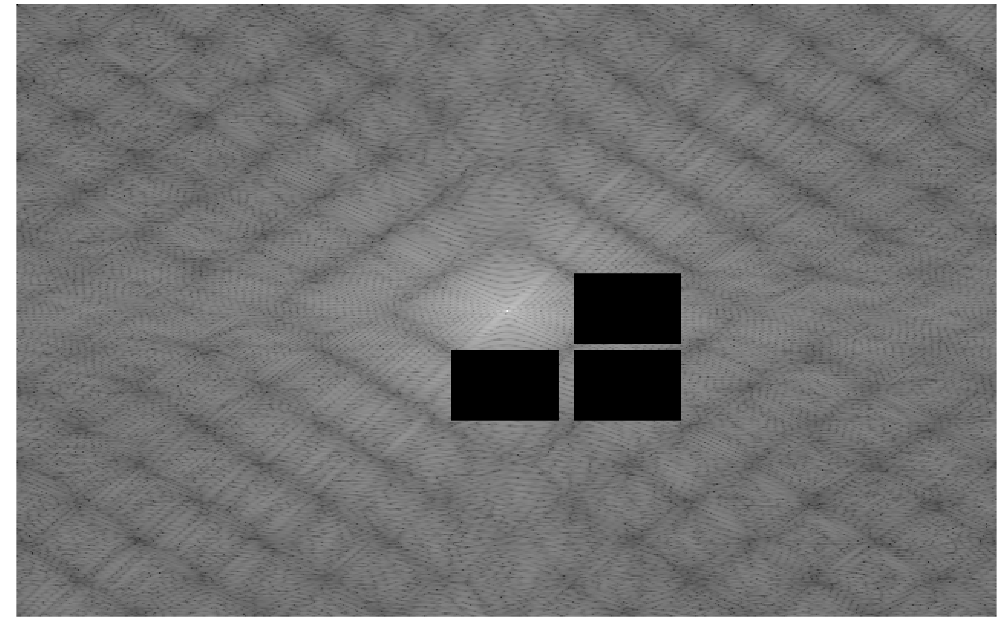

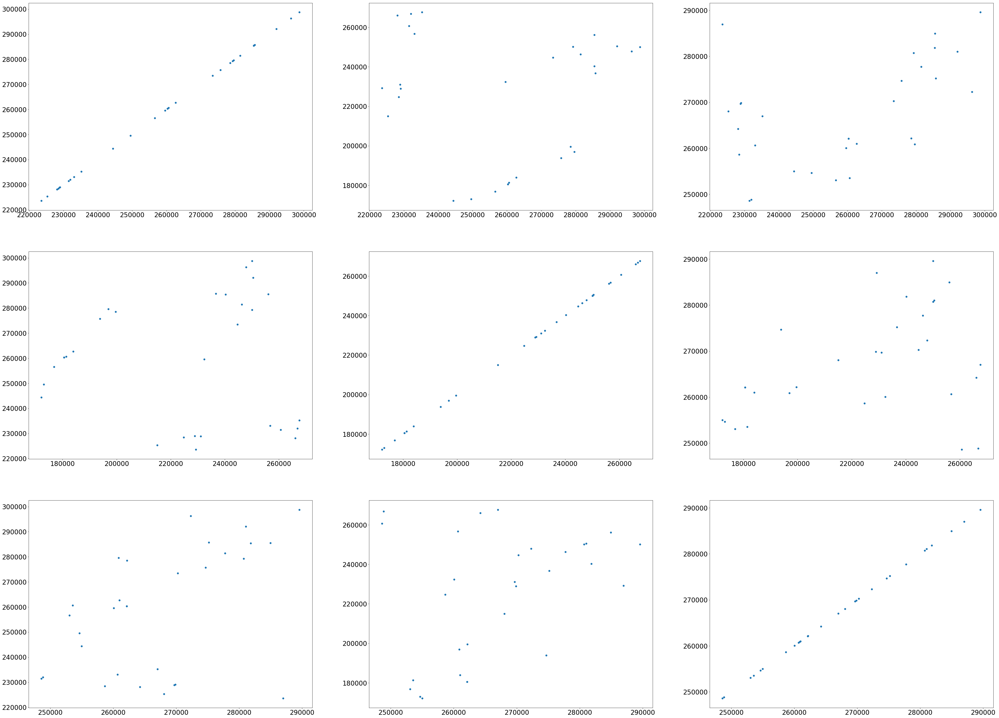

In [42]:
#Create subplots for comparisons
boxVis = plt.figure()
boxAx1 = boxVis.add_subplot(1,1,1)


#Defines where a box will be placed.
def checkBoxPlot(magData):
    for i in range(-23,23):
        for j in range(-35,35):
            magData[249+i][319+j] = 0
            
    for i in range(-23,23):
        for j in range(-35,35):
            magData[249+i][399+j] = 0
            
    for i in range(-23,23):
        for j in range(-35,35):
            magData[199+i][399+j] = 0
    return magData


#Visualises where the block feature extraction will be placed.
def visualise(fftData,axA):
    axA.axis('off')
    axA.imshow( checkBoxPlot(np.log(fftData[1] + 1)), cmap='gray' ) # io.
    return

visualise(sFFT,boxAx1)


#Gets the total power of the box from the image.
def getBoxPower(magArr,x,y):
    power = 0
    for i in range(-23,23):
        for j in range(-35,35):
            power += magArr[x+i][y+j] ** 2
    return power


#Gets an array of power values where each one corresponds to the image number and 3 box power values.
def getBoxPowArr(letMagArr): #Pass in all of the magnitude values for a letter (all 10 gifs)
    powArr = []
    for i in range(10):
        row = [getBoxPower(letMagArr[i],249,319),getBoxPower(letMagArr[i],249,399),getBoxPower(letMagArr[i],199,399)]
        powArr.append(row)
    return powArr


#Get the power arrays for each letter and combine them in to a single matrix.
sBoxPowArr = getBoxPowArr(sMagArr)
tBoxPowArr = getBoxPowArr(tMagArr)
vBoxPowArr = getBoxPowArr(vMagArr)

X = sBoxPowArr + tBoxPowArr + vBoxPowArr


#Plots each column of a matrix against itself and the others.
def plotmatrix(Matrix):
  r, c = Matrix.shape
  fig = plt.figure()
  plotID = 1
  for i in range(c):
    for j in range(c):
      ax = fig.add_subplot( c, c, plotID )
      ax.scatter( Matrix[:,i], Matrix[:,j] )
      plotID += 1
  plt.show()

plotmatrix(np.matrix(X))

As you can see, this doesn't deliver great clusters so we need to find different features. Now using 5 sectors around the x axis

## Part 2.2: Spectral Sector Feature Extraction

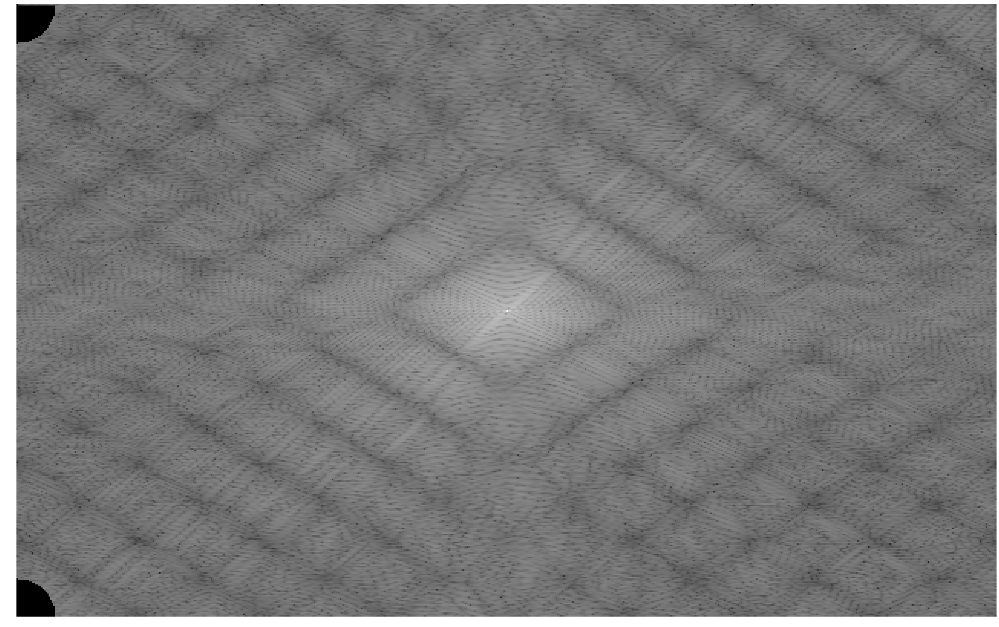

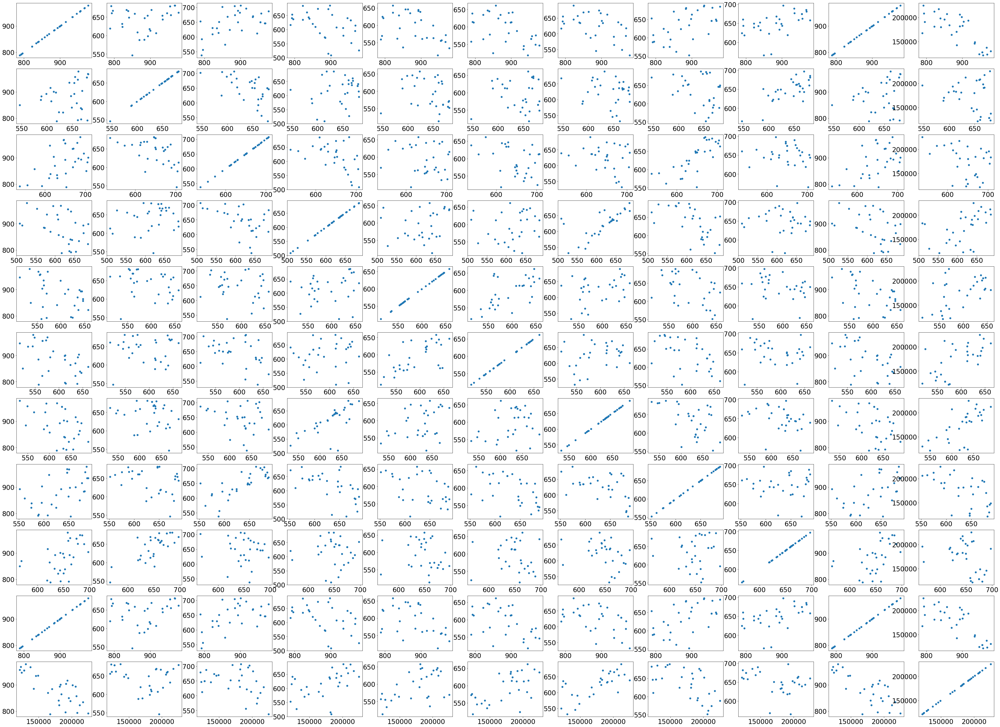

In [44]:
#Retrieves an array of sectors where each entry has an array of pixel values located within that sector.
def getSectors():
    fig = plt.figure()
    sectors = []
    sec1 = []
    sec2 = []
    sec3 = []
    sec4 = []
    sec5 = []
    sec6 = []
    sec7 = []
    sec8 = []
    sec9 = []
    sec10 = []
    D = []
    for i in range(-25,25):
        for j in range(0,25):
            if((j ** 2) + (i ** 2) <= (25 ** 2)):
                #if((np.dot(-v1,i)*np.dot(v2,j) + np.dot(v1,j)*np.dot(v2,i)) > 0):
                #D.append([i,j])
                if(i!=0):
                #    if(np.arctan(j/i)<0):
                #        deg = 180 + np.rad2deg(np.arctan(j/i))
                #    else:
                #        deg = np.rad2deg(np.arctan(j/i))
                #    if(deg <= theta1 and deg >= theta2):
                #        D.append([i,j])
                    if(np.arctan(j/i) <= np.deg2rad(18) and np.arctan(j/i) >= np.deg2rad(0)):
                        sec1.append([i,j])
                        sec10.append([-i,j])
                    if(np.arctan(j/i) <= np.deg2rad(36) and np.arctan(j/i) >= np.deg2rad(18)):
                        sec2.append([i,j])
                        sec9.append([-i,j])
                    if(np.arctan(j/i) <= np.deg2rad(54) and np.arctan(j/i) >= np.deg2rad(36)):
                        sec3.append([i,j])
                        sec8.append([-i,j])
                    if(np.arctan(j/i) <= np.deg2rad(72) and np.arctan(j/i) >= np.deg2rad(54)):
                        sec4.append([i,j])
                        sec7.append([-i,j])
                    if(np.arctan(j/i) <= np.deg2rad(90) and np.arctan(j/i) >= np.deg2rad(72)):
                        sec5.append([i,j])
                        sec6.append([-i,j])
    #sec1 = np.transpose(sec1)
    #sec2 = np.transpose(sec2)
    #sec3 = np.transpose(sec3)
    #sec4 = np.transpose(sec4)
    #sec5 = np.transpose(sec5)
    #sec6 = np.transpose(sec6)
    #sec7 = np.transpose(sec7)
    #sec8 = np.transpose(sec8)
    #sec9 = np.transpose(sec9)
    #sec10 = np.transpose(sec10)
    sectors.append(sec1)
    sectors.append(sec2)
    sectors.append(sec3)
    sectors.append(sec4)
    sectors.append(sec5)
    sectors.append(sec6)
    sectors.append(sec7)
    sectors.append(sec8)
    sectors.append(sec9)
    sectors.append(sec10)
    #print(np.shape(sectors))
    #testAx = fig.add_subplot(111)
    #testAx.scatter(sec1[0],sec1[1],c='red')
    #testAx.scatter(sec2[0],sec2[1],c='green')
    #testAx.scatter(sec3[0],sec3[1],c='blue')
    #testAx.scatter(sec4[0],sec4[1],c='red')
    #testAx.scatter(sec5[0],sec5[1],c='green')
    #testAx.scatter(sec6[0],sec6[1],c='blue')
    #testAx.scatter(sec7[0],sec7[1],c='red')
    #testAx.scatter(sec8[0],sec8[1],c='green')
    #testAx.scatter(sec9[0],sec9[1],c='blue')
    #testAx.scatter(sec10[0],sec10[1],c='red')
    #plt.show()
    return sectors

#Create subplots for comparisons
secVis = plt.figure()
secAx1 = secVis.add_subplot(1,1,1)

#Retrieves an array of sectors where each entry has an array of pixel values located within that sector.
def visualiseSectors(magData):
    for i in range(-25,25):
        for j in range(0,25):
            if((j ** 2) + (i ** 2) <= (25 ** 2)):
                if(i!=0):
                    if(np.arctan(j/i) <= np.deg2rad(18) and np.arctan(j/i) >= np.deg2rad(0)):
                        magData[i][j]=0
                        magData[-i][j]=0
                    if(np.arctan(j/i) <= np.deg2rad(36) and np.arctan(j/i) >= np.deg2rad(18)):
                        magData[i][j]=0
                        magData[-i][j]=0
                    if(np.arctan(j/i) <= np.deg2rad(54) and np.arctan(j/i) >= np.deg2rad(36)):
                        magData[i][j]=0
                        magData[-i][j]=0
                    if(np.arctan(j/i) <= np.deg2rad(72) and np.arctan(j/i) >= np.deg2rad(54)):
                        magData[i][j]=0
                        magData[-i][j]=0
                    if(np.arctan(j/i) <= np.deg2rad(90) and np.arctan(j/i) >= np.deg2rad(72)):
                        magData[i][j]=0
                        magData[-i][j]=0
                        
    return magData

def visualise2(fftData,axA):
    axA.axis('off')
    axA.imshow( visualiseSectors(np.log(fftData[1] + 1)), cmap='gray' ) # io.
    return

visualise2(sFFT,secAx1)

#Gets the power of a sector.
def getSecPower(magArr,sec):
    power = 0
    for i in range(len(sec[0])):
        for j in range(len(sec[1])):
            power += magArr[sec[1][j]+200][sec[0][1]+320] ** 2
    return power


#Gets an array of entries where each corresponds to the power of every sector on the image.
def getSecPowArr(letMagArr,secArr):
    powArr = []
    for i in range(10):
        row = []
        for j in range(10):
            row.append(getSecPower(letMagArr[i],secArr[j]))
        row.append(getBoxPower(letMagArr[i],0,0))
        powArr.append(row)
    return powArr


#Get all sector power arrays for each letter and combine them in to a matrix and plot them.
secCoords = getSectors()
sSecPowArr = getSecPowArr(sMagArr,secCoords)
tSecPowArr = getSecPowArr(tMagArr,secCoords)
vSecPowArr = getSecPowArr(vMagArr,secCoords)

Y = sSecPowArr + tSecPowArr + vSecPowArr

plotmatrix(np.matrix(Y))

#S = np.transpose(sSecPowArr)
#T = np.transpose(tSecPowArr)
#V = np.transpose(vSecPowArr)
#dimFig = plt.figure()
#dimAx = dimFig.add_subplot(111)
#dimAx.scatter( S[4], S[6],s=200,c="red" )
#dimAx.scatter( T[4], T[6],s=200,c="blue" )
#dimAx.scatter( V[4], V[6],s=200,c="green" )
#plt.show()


Dimensions 7 and 5 differentiate the points into clusters the best

## Section 2.3: Spectral Sector Feature Extraction 2

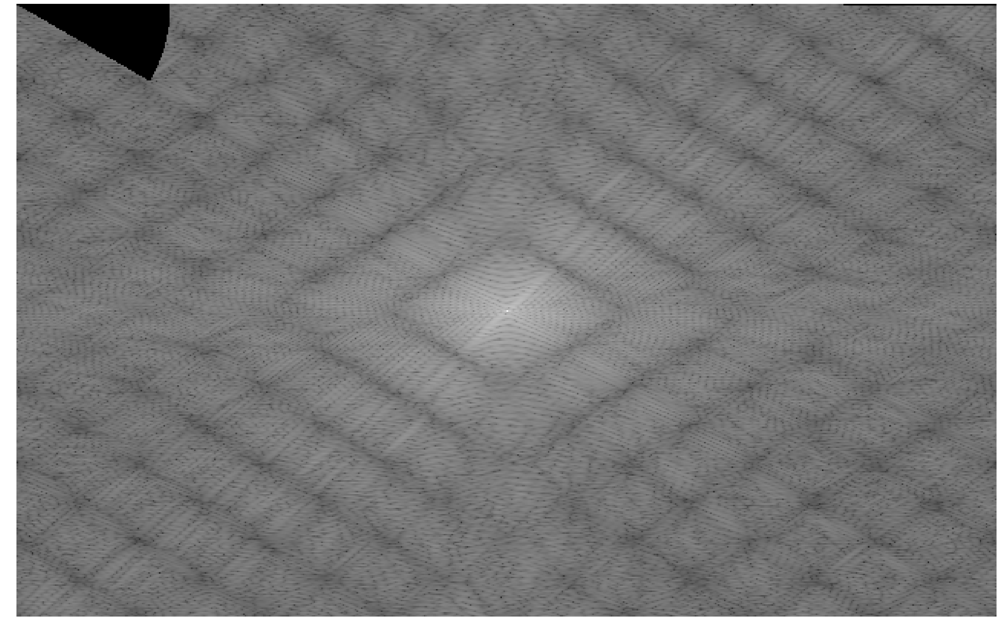

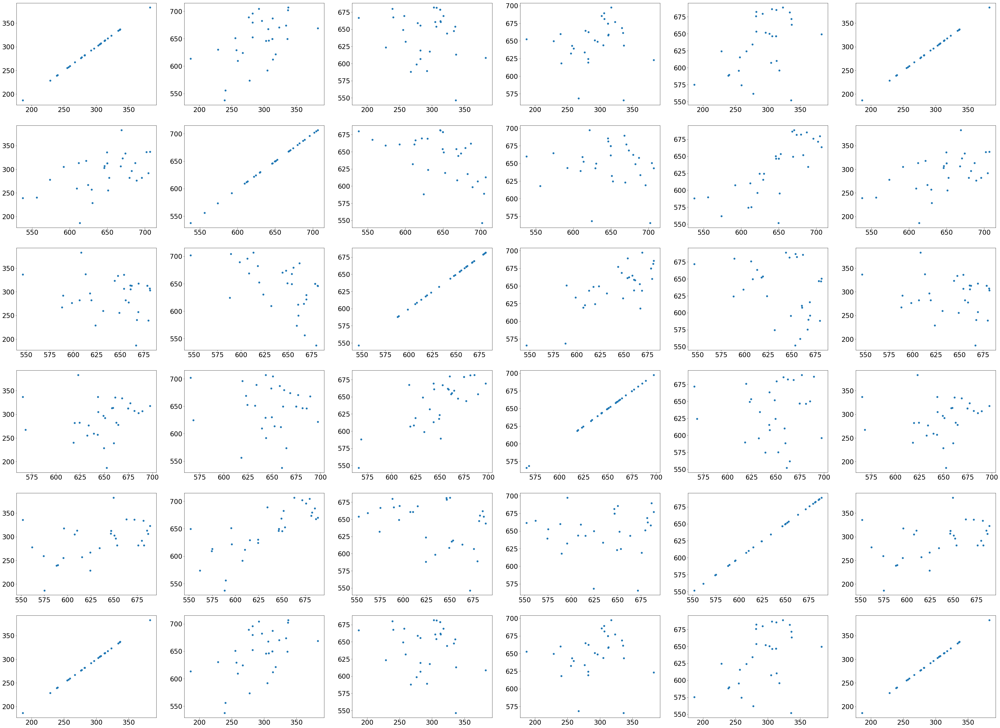

In [51]:
def getSectors2():
    fig = plt.figure()
    sectors = []
    sec1 = []
    sec2 = []
    sec3 = []
    sec4 = []
    sec5 = []
    sec6 = []
    for i in range(0,100):
        for j in range(-100,100):
            if((j ** 2) + (i ** 2) <= (100 ** 2)):
                #if((np.dot(-v1,i)*np.dot(v2,j) + np.dot(v1,j)*np.dot(v2,i)) > 0):
                #D.append([i,j])
                if(j!=0):
                #    if(np.arctan(j/i)<0):
                #        deg = 180 + np.rad2deg(np.arctan(j/i))
                #    else:
                #        deg = np.rad2deg(np.arctan(j/i))
                #    if(deg <= theta1 and deg >= theta2):
                #        D.append([i,j])
                    if(np.arctan(i/j) <= np.deg2rad(30) and np.arctan(i/j) >= np.deg2rad(0)):
                        sec1.append([i,j])
                        sec6.append([i,-j])
                    if(np.arctan(i/j) <= np.deg2rad(60) and np.arctan(i/j) >= np.deg2rad(30)):
                        sec2.append([i,j])
                        sec5.append([i,-j])
                    if(np.arctan(i/j) <= np.deg2rad(90) and np.arctan(i/j) >= np.deg2rad(60)):
                        sec3.append([i,j])
                        sec4.append([i,-j])
    #sec1 = np.transpose(sec1)
    #sec2 = np.transpose(sec2)
    #sec3 = np.transpose(sec3)
    #sec4 = np.transpose(sec4)
    #sec5 = np.transpose(sec5)
    #sec6 = np.transpose(sec6)
    sectors.append(sec1)
    sectors.append(sec2)
    sectors.append(sec3)
    sectors.append(sec4)
    sectors.append(sec5)
    sectors.append(sec6)
    #testAx = fig.add_subplot(111)
    #testAx.scatter(sec1[1],sec1[0],c='red')
    #testAx.scatter(sec2[1],sec2[0],c='green')
    #testAx.scatter(sec3[1],sec3[0],c='blue')
    #testAx.scatter(sec4[1],sec4[0],c='red')
    #testAx.scatter(sec5[1],sec5[0],c='green')
    #testAx.scatter(sec6[1],sec6[0],c='blue')
    #plt.show()
    return sectors


#Retrieves an array of sectors where each entry has an array of pixel values located within that sector.
def visualiseSectors2(magData):
    for i in range(0,100):
        for j in range(-100,100):
            if((j ** 2) + (i ** 2) <= (100 ** 2)):
                if(j!=0):
                    if(np.arctan(i/j) <= np.deg2rad(30) and np.arctan(i/j) >= np.deg2rad(0)):
                        magData[i][j]=0
                        magData[-i][j]=0
                    if(np.arctan(i/j) <= np.deg2rad(60) and np.arctan(i/j) >= np.deg2rad(30)):
                        magData[i][j]=0
                        magData[-i][j]=0
                    if(np.arctan(i/j) <= np.deg2rad(90) and np.arctan(i/j) >= np.deg2rad(60)):
                        magData[i][j]=0
                        magData[-i][j]=0           
    return magData

def visualise3(fftData,axA):
    axA.axis('off')
    axA.imshow( visualiseSectors2(np.log(fftData[1] + 1)), cmap='gray' ) # io.
    return

#Create subplots for comparisons
sec2Vis = plt.figure()
sec2Ax1 = sec2Vis.add_subplot(1,1,1)

visualise3(sFFT,sec2Ax1)

def getSecPowArr2(letMagArr,secArr):
    powArr = []
    for i in range(10):
        row = []
        for j in range(6):
            row.append(getSecPower(letMagArr[i],secArr[j]))
        powArr.append(row)
    return powArr

secCoor2 = getSectors2()

sSecPowArr2 = getSecPowArr2(sMagArr,secCoor2)
tSecPowArr2 = getSecPowArr2(tMagArr,secCoor2)
vSecPowArr2 = getSecPowArr2(vMagArr,secCoor2)

Z = sSecPowArr2 + tSecPowArr2 + vSecPowArr2

plotmatrix(np.matrix(Z))

## Part 2.4: Spectral Box Feature extraction 2

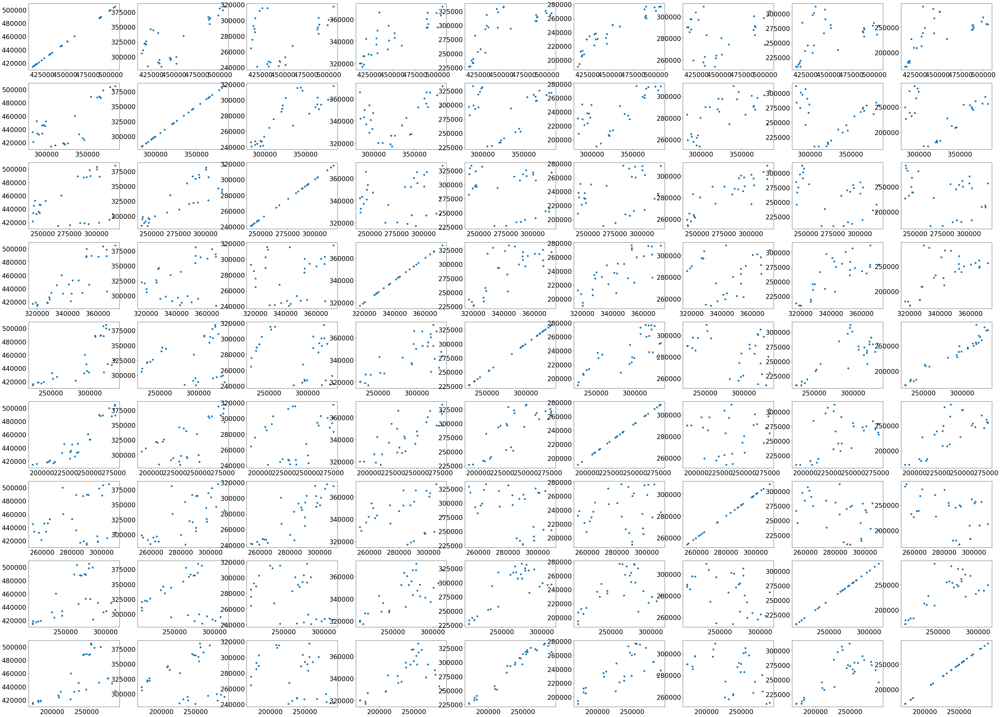

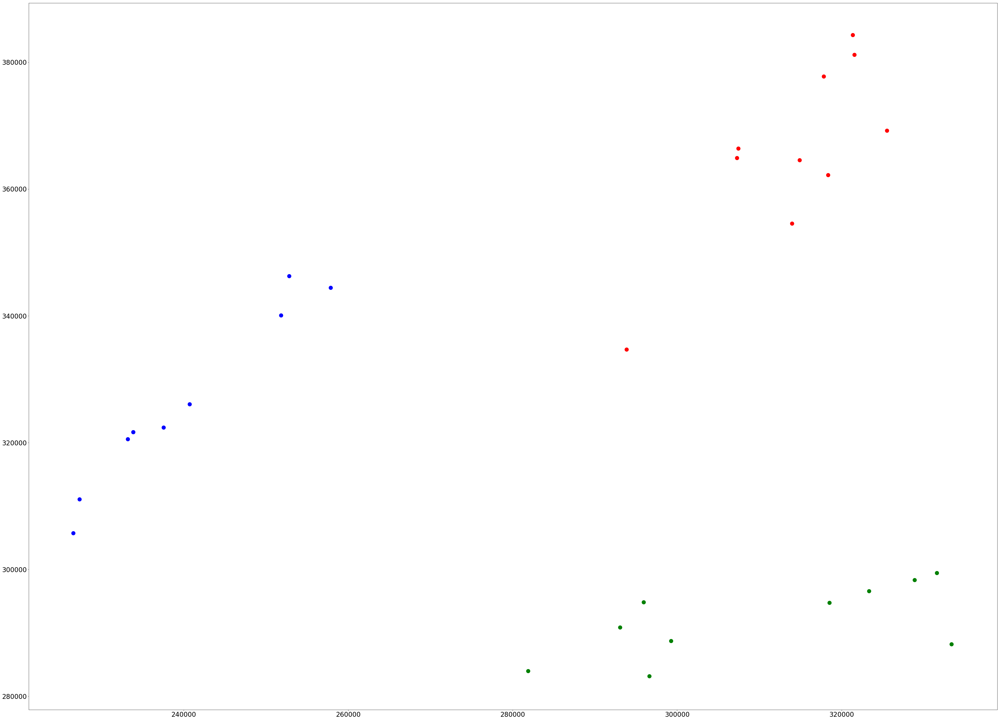

In [48]:
def getBoxGrid(letMagArr):
    arr = []
    for i in range(10):
        row = []
        for j in range(3):
            for k in range(3):
                power = 0
                for l in range(50):
                    for m in range(80):
                        power += letMagArr[i][170+(50*k)+l][272+(80*j)+m] ** 2
                row.append(power)
        arr.append(row)
    return arr

sNewPowArr = getBoxGrid(sMagArr)
tNewPowArr = getBoxGrid(tMagArr)
vNewPowArr = getBoxGrid(vMagArr)
               
P = sNewPowArr + tNewPowArr + vNewPowArr

plotmatrix(np.matrix(P))

S = np.transpose(sNewPowArr)
T = np.transpose(tNewPowArr)
V = np.transpose(vNewPowArr)
dimFig = plt.figure()
dimAx = dimFig.add_subplot(111)
dimAx.scatter( S[4], S[1],s=200,c="red" )
dimAx.scatter( T[4], T[1],s=200,c="blue" )
dimAx.scatter( V[4], V[1],s=200,c="green" )
plt.show()

## Part 2.5: Spectral Sector Feature Extraction 3

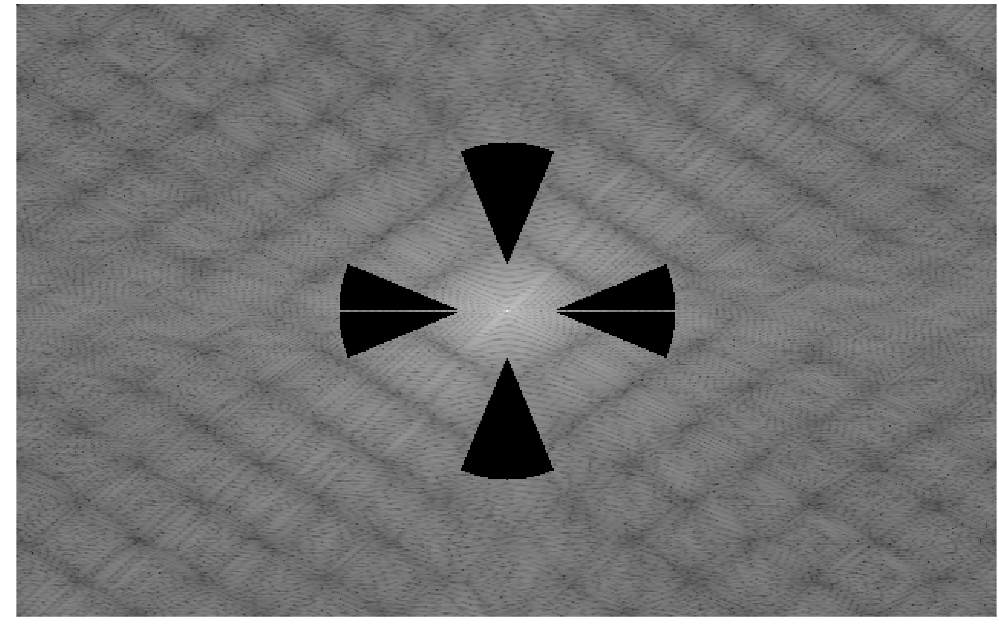

[232, 320]
1293
400


IndexError: list index out of range

In [98]:


#Gives a visual representation of sectors used.
def visualiseSectors3(magData):
    for i in range(0,100):
        for j in range(0,120):
            if((j ** 2) + (i ** 2) <= (80 ** 2)):
                if(i!=0):
                    if(np.arctan(j/i) <= np.deg2rad(22.5) and np.arctan(j/i) >= np.deg2rad(0)):
                        magData[230+i][320+j]=0#bottom right
                        magData[170-i][320-j]=0#top left
                        magData[170-i][320+j]=0#top right
                        magData[230+i][320-j]=0#bottom left
                    if(np.arctan(j/i) <= np.deg2rad(90) and np.arctan(j/i) >= np.deg2rad(67.5)):
                        magData[200+i][350+j]=0#bottom right
                        magData[200-i][290-j]=0#top left
                        magData[200-i][350+j]=0#top right
                        magData[200+i][290-j]=0#bottom left
    return magData

def visualise4(fftData,axA):
    axA.axis('off')
    axA.imshow( visualiseSectors3(np.log(fftData[1] + 1)), cmap='gray' ) # io.
    return

#Create subplots for comparisons
sec3Vis = plt.figure()
sec3Ax1 = sec3Vis.add_subplot(1,1,1)

visualise4(sFFT,sec3Ax1)

plt.show()



#Retrieves an array of sectors where each entry has an array of pixel values located within that sector.
def getSectors():
    sectors = []
    sec1 = []
    sec2 = []
    sec3 = []
    sec4 = []
    sec5 = []
    sec6 = []
    sec7 = []
    sec8 = []
    for i in range(0,100):
        for j in range(0,120):
            if((j ** 2) + (i ** 2) <= (80 ** 2)):
                if(i!=0):
                    if(np.arctan(j/i) <= np.deg2rad(22.5) and np.arctan(j/i) >= np.deg2rad(0)):
                        sec1.append([230+i,320+j])#bottom right
                        sec2.append([170-i,320-j])#top left
                        sec3.append([170-i,320+j])#top right
                        sec4.append([230+i,320-j])#bottom left
                    if(np.arctan(j/i) <= np.deg2rad(22.5) and np.arctan(j/i) >= np.deg2rad(0)):
                        sec5.append([200+i,350+j])#bottom right
                        sec6.append([200-i,290-j])#top left
                        sec7.append([200-i,350+j])#top right
                        sec8.append([200+i,290-j])#bottom left
    sectors.append(sec1)
    sectors.append(sec2)
    sectors.append(sec3)
    sectors.append(sec4)
    sectors.append(sec5)
    sectors.append(sec6)
    sectors.append(sec7)
    sectors.append(sec8)
    return sectors


#Gets the power of a sector.
def getSecPower2(magArr,sec):
    power = 0
    for i in range(len(sec)):
        power += magArr[sec[i][0]][sec[[i][1]]] ** 2
    return power


#Gets the power of a sector.
def getSecPower(magArr,sec):
    power = 0
    for i in range(len(sec[0])):
        for j in range(len(sec[1])):
            power += magArr[sec[1][j]+200][sec[0][1]+320] ** 2
    return power

def getSecPowArr3(letMagArr,secArr):
    powArr = []
    for i in range(10):
        row = []
        for j in range(8):
            row.append(getSecPower2(letMagArr[i],secArr[j]))
        powArr.append(row)
    return powArr

secCoor2 = getSectors()

sect = secCoor2[0]
print(sect[1])
print(len(sect))
print(len(sMagArr[0]))

sSecPowArr3 = getSecPowArr3(sMagArr,secCoor2)
tSecPowArr3 = getSecPowArr3(tMagArr,secCoor2)
vSecPowArr3 = getSecPowArr3(vMagArr,secCoor2)

Z = sSecPowArr3 + tSecPowArr3 + vSecPowArr3

plotmatrix(np.matrix(Z))

P = np.transpose(P)
Data = []
Data.append(P[4])
Data.append(P[1])
print(np.shape(Data))
Data = np.transpose(Data)
nbrs = NearestNeighbors(n_neighbors=2, algorithm='auto').fit(Data)
distances, indices = nbrs.kneighbors(Data)
#from http://scikit-learn.org/stable/auto_examples/neighbors/plot_classification.html#sphx-glr-auto-examples-neighbors-plot-classification-py
delta = 10
cmap_light = ListedColormap(['#FFAAAA', '#AAFFAA', '#AAAAFF'])
cmap_bold = ListedColormap(['#FF0000', '#00FF00', '#0000FF'])
clf = neighbors.KNeighborsClassifier(2)
clf.fit(Data,indices)
x_min, x_max = Data[0].min() - 1, Data[0].max() + 1
y_min, y_max = Data[1].min() - 1, Data[1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, delta),
                     np.arange(y_min, y_max, delta))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
  # Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure()
plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot also the training points
plt.scatter(Data[0], Data[1], c=y, cmap=cmap_bold)
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.title("3-Class classification (k = 2")

plt.show()

In [8]:
print(np.shape(P))
Data = []
Data.append(P[1])
Data.appen

(30, 9)


AttributeError: 'list' object has no attribute 'appen'